In [1]:
import pickle

import matplotlib.pyplot as plt
from matplotlib import collections as mc
import numpy as np
import sklearn
from sklearn import linear_model
import torch

import os
os.chdir('..')

from latent_actions import cvae
from latent_actions.data.dataset import EpisodicDataset
from panda_gym.pybullet import PyBullet
from panda_gym.envs.robots.panda import Panda

/Users/shivampatel/miniconda3/envs/la/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
pybullet build time: Aug 21 2022 17:44:27


In [2]:
with open('data/rpnp_traj_with_pose_new.pkl', 'rb') as fp:
    epi_ds = pickle.load(fp)

In [3]:
def visualize_encoder(decoder):
    actions_joints_test = np.array([np.hstack([step.ee_velocity, step.gripper_velocity, step.context['ee_pos'], step.context['gripper_width']]) for epi in epi_ds.episodes for step in epi.steps])  
    actions_joints_test = actions_joints_test.reshape(actions_joints_test.shape[0], -1)

    x = decoder.encoder(torch.tensor(actions_joints_test, dtype=torch.float))
    mu = decoder.fc_mu(x).detach().numpy()
    log_var = decoder.fc_var(x)
    std = torch.exp(log_var / 2).detach().numpy()

    std_x = std.copy()
    std_x[:, 1] = 0
    std_y = std.copy()
    std_y[:, 0] = 0

    horizontal_lines = list(zip(mu-std_x, mu+std_x))
    vertical_lines = list(zip(mu-std_y, mu+std_y))

    hlc = mc.LineCollection(horizontal_lines, linewidths=0.01)
    vlc = mc.LineCollection(vertical_lines, linewidths=0.01)
    
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.add_collection(hlc)
    ax.add_collection(vlc)
    ax.autoscale()
    ax.margins(0.1)
    ax.scatter(mu[:, 0], mu[:, 1])
    ax.set_title('mean and variance of encoder')
    
    plt.show()

In [4]:
def get_latent_bounds(decoder):
    actions_joints_test = np.array([np.hstack([step.ee_velocity, step.gripper_velocity, step.context['ee_pos'], step.context['gripper_width']]) for epi in epi_ds.episodes for step in epi.steps])  
    actions_joints_test = actions_joints_test.reshape(actions_joints_test.shape[0], -1)

    x = decoder.encoder(torch.tensor(actions_joints_test, dtype=torch.float))
    mu = decoder.fc_mu(x).detach().numpy()
    log_var = decoder.fc_var(x)
    std = torch.exp(log_var / 2).detach().numpy()

    return {
        'x_min': min((mu - std)[:, 0]), 
        'x_max': max((mu + std)[:, 0]), 
        'y_min': min((mu - std)[:, 1]), 
        'y_max': max((mu + std)[:, 1])}

In [5]:
def get_latent_bounds_ae(decoder):
    actions_joints_test = np.array([np.hstack([step.ee_velocity, step.gripper_velocity, step.context['ee_pos'], step.context['gripper_width']]) for epi in epi_ds.episodes for step in epi.steps])  
    actions_joints_test = actions_joints_test.reshape(actions_joints_test.shape[0], -1)

    x = decoder.encoder(torch.tensor(actions_joints_test, dtype=torch.float))
#     mu = decoder.fc_mu(x).detach().numpy()
#     log_var = decoder.fc_var(x)
#     std = torch.exp(log_var / 2).detach().numpy()

    return {
        'x_min': min(x[:, 0]).item(), 
        'x_max': max(x[:, 0]).item(), 
        'y_min': min(x[:, 1]).item(), 
        'y_max': max(x[:, 1]).item()}

In [6]:
joint_angles_at_goals = np.array([[ 0.335, -0.189, 0.1, 0.08], # o1
        [ 0.537, -0.028, 0.1, 0.08], # o2
        [ 0.334,  0.158, 0.1, 0.08], # g1
        [ 0.542, -0.195, 0.1, 0.08], # g2
        [ 0.334, -0.03, 0.1, 0.08], # base
        [ 0.435, -0.192, 0.1, 0.02], # o1-g2
        [ 0.34786623, -0.11570269, -0.0297778, 0.08], # o1-g1
        [0.536, -0.11, 0.1, 0.02], # o2-g2
        [0.435, 0.65, 0.1, 0.02]]) # o2-g1

In [7]:
def visualize_decoder(decoder, x_min, x_max, y_min, y_max, subtract_neutral_from_context = False):
    x, y = np.meshgrid(
        np.arange(x_min, x_max, (x_max - x_min) / 20), 
        np.arange(y_min, y_max, (y_max - y_min) / 20))
    latents = torch.tensor(list(zip(x.reshape(-1), y.reshape(-1))), dtype=torch.float)

    fig, axs = plt.subplots(3, 3, figsize=(20, 3))
    

    for i, joint_angles in enumerate(joint_angles_at_goals):

        contexts = torch.tensor(np.stack([joint_angles] * latents.shape[0]), dtype=torch.float)
        if subtract_neutral_from_context:
            contexts -= torch.tensor(neutral_joint_angles[:8])
        actions_joints = decoder(latent=latents, context=contexts).detach().numpy()
        axs[i // 3, i % 3].imshow(np.concatenate([actions_joints[:, i].reshape(20, 20) for i in range(3)], axis=1))
        axs[i // 3, i % 3].set_title(i)

#     contexts = torch.tensor(np.stack([neutral_joint_angles[:7]] * latents.shape[0]), dtype=torch.float)
#     if subtract_neutral_from_context:
#         contexts -= torch.tensor(neutral_joint_angles[:7])
#     actions_joints = decoder(latent=latents, context=contexts).detach().numpy()
#     axs[1, 1].imshow(np.concatenate([actions_joints[:, i].reshape(20, 20) for i in range(7)], axis=1))

In [8]:
def visualize_decoder_forward_kinematics(decoder, x_min, x_max, y_min, y_max, subtract_neutral_from_context = False):
    x, y = np.meshgrid(
        np.arange(x_min, x_max, (x_max - x_min) / 20), 
        np.arange(y_min, y_max, (y_max - y_min) / 20))
    latents = torch.tensor(list(zip(x.reshape(-1), y.reshape(-1))), dtype=torch.float)
    
    fig = plt.figure(figsize=(20, 20))
    print(x.shape, y.shape)

    for i, joint_angles in enumerate(joint_angles_at_goals):

        contexts = torch.tensor(np.stack([joint_angles] * latents.shape[0]), dtype=torch.float)
        if subtract_neutral_from_context:
            contexts -= torch.tensor(neutral_joint_angles[:8])
        actions_joints = decoder(latent=latents, context=contexts).detach().numpy()

#         actions_ee = []
#         robot.set_joint_angles(joint_angles)
#         current_ee_position = robot.get_ee_position()

#         for action_joints in actions_joints:
#             robot.set_action(action_joints)
#             sim.step()
#             actions_ee.append(robot.get_ee_position() - current_ee_position)
#             robot.set_joint_angles(joint_angles)

#         actions_ee = np.array(actions_ee)
#         axs = fig.add_subplot(3, 3, i+1, projection='3d')
#         axs.quiver(x, y, np.zeros_like(x), actions_ee[:, 0].reshape(20, 20), actions_ee[:, 1].reshape(20, 20), actions_ee[:, 2].reshape(20, 20))
#         axs.set_title(i)
        
        actions_ee_plot = actions_joints[:,:3]/np.linalg.norm(actions_joints[:,:3], axis=1)[:,np.newaxis]
        actions_ee_plot *= 0.02
        
        axs = fig.add_subplot(3, 3, i+1, projection='3d')
        axs.quiver(x, y, np.zeros_like(x), actions_ee_plot[:, 0].reshape(20, 20), actions_ee_plot[:, 1].reshape(20, 20), actions_ee_plot[:, 2].reshape(20, 20))
        axs.set_title(i)
    
    plt.show()

In [9]:
def visualize_decoder_forward_kinematics_2d(decoder, x_min, x_max, y_min, y_max, subtract_neutral_from_context = False):
    x, y = np.meshgrid(
        np.arange(x_min, x_max, (x_max - x_min) / 20), 
        np.arange(y_min, y_max, (y_max - y_min) / 20))
    latents = torch.tensor(list(zip(x.reshape(-1), y.reshape(-1))), dtype=torch.float)
    
    fig = plt.figure(figsize=(20, 20))
    print(x.shape, y.shape)

    for i, joint_angles in enumerate(joint_angles_at_goals):

        contexts = torch.tensor(np.stack([joint_angles] * latents.shape[0]), dtype=torch.float)
        if subtract_neutral_from_context:
            contexts -= torch.tensor(neutral_joint_angles[:8])
        actions_joints = decoder(latent=latents, context=contexts).detach().numpy()

#         actions_ee = []
#         robot.set_joint_angles(joint_angles)
#         current_ee_position = robot.get_ee_position()

#         for action_joints in actions_joints:
#             robot.set_action(action_joints)
#             sim.step()
#             actions_ee.append(robot.get_ee_position() - current_ee_position)
#             robot.set_joint_angles(joint_angles)

#         actions_ee = np.array(actions_ee)
#         axs = fig.add_subplot(3, 3, i+1, projection='3d')
#         axs.quiver(x, y, np.zeros_like(x), actions_ee[:, 0].reshape(20, 20), actions_ee[:, 1].reshape(20, 20), actions_ee[:, 2].reshape(20, 20))
#         axs.set_title(i)
        
#         actions_ee_plot = actions_joints[:,:3]/np.linalg.norm(actions_joints[:,:3], axis=1)[:,np.newaxis]
#         actions_ee_plot *= 0.02
        
        axs = fig.add_subplot(3, 3, i+1)
        axs.quiver(y, x, actions_joints[:, 1].reshape(20, 20), actions_joints[:, 0].reshape(20, 20))
        axs.set_title(i)
    
    plt.show()

In [10]:
def offline_evaluation(decoder, subtract_neutral_from_context = False):
    fig = plt.figure(figsize=(10, 10))

    for episode in episodes[:30]:
        ee_positions_ground_truth = np.array(
            [step['previous_observation']['achieved_goal'] for step in episode])
        plt.scatter(ee_positions_ground_truth[:, 0], ee_positions_ground_truth[:, 1], color='r')

        obs = env.reset()

        ee_positions_predicted = []
        for step in episode:
            context = torch.tensor(step['previous_joint_angles'], dtype=torch.float)
            if subtract_neutral_from_context:
                context -= torch.tensor(neutral_joint_angles[:7])
            z = decoder.encoder(
                torch.cat((
                    torch.tensor(step['action_joints'], dtype=torch.float), 
                    context))).reshape(1, -1)
            z = decoder.fc_mu(z)
            joint_action = decoder(
                latent=z, 
                context=context.reshape(1, -1))
            obs, _, _, _ = env.step(joint_action.detach().numpy().squeeze())
            ee_positions_predicted.append(obs['achieved_goal'])

        ee_positions_predicted = np.array(ee_positions_predicted)
        plt.scatter(ee_positions_predicted[:, 0], ee_positions_predicted[:, 1], color='b')

    plt.show()

## VAE

In [11]:
decoder = cvae.ConditionalVAE.load_from_checkpoint('checkpoints/ee-vae.ckpt')

In [12]:
decoder

ConditionalVAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (fc_mu): Linear(in_features=10, out_features=2, bias=True)
  (fc_var): Linear(in_features=10, out_features=2, bias=True)
  (dropout): Dropout(p=0, inplace=False)
)

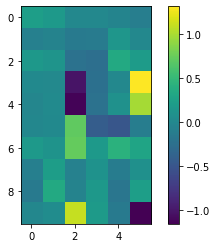

In [13]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

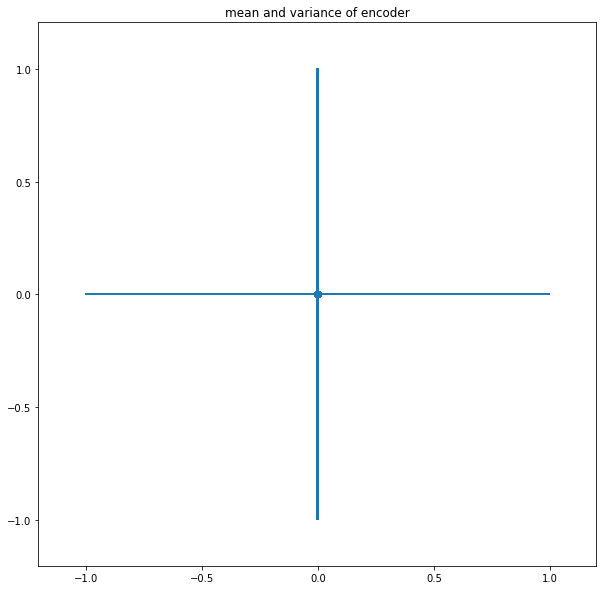

In [14]:
visualize_encoder(decoder)

{'x_min': -1.0046217, 'x_max': 1.0001574, 'y_min': -1.0014056, 'y_max': 1.0049253}


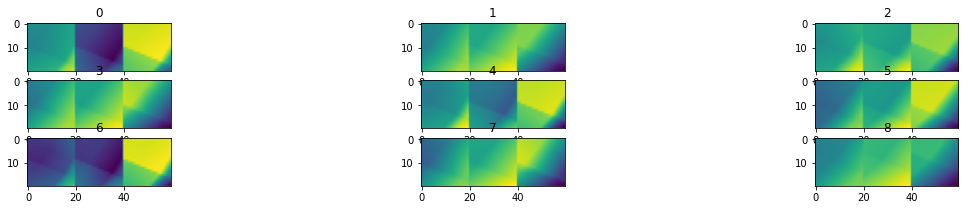

In [15]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


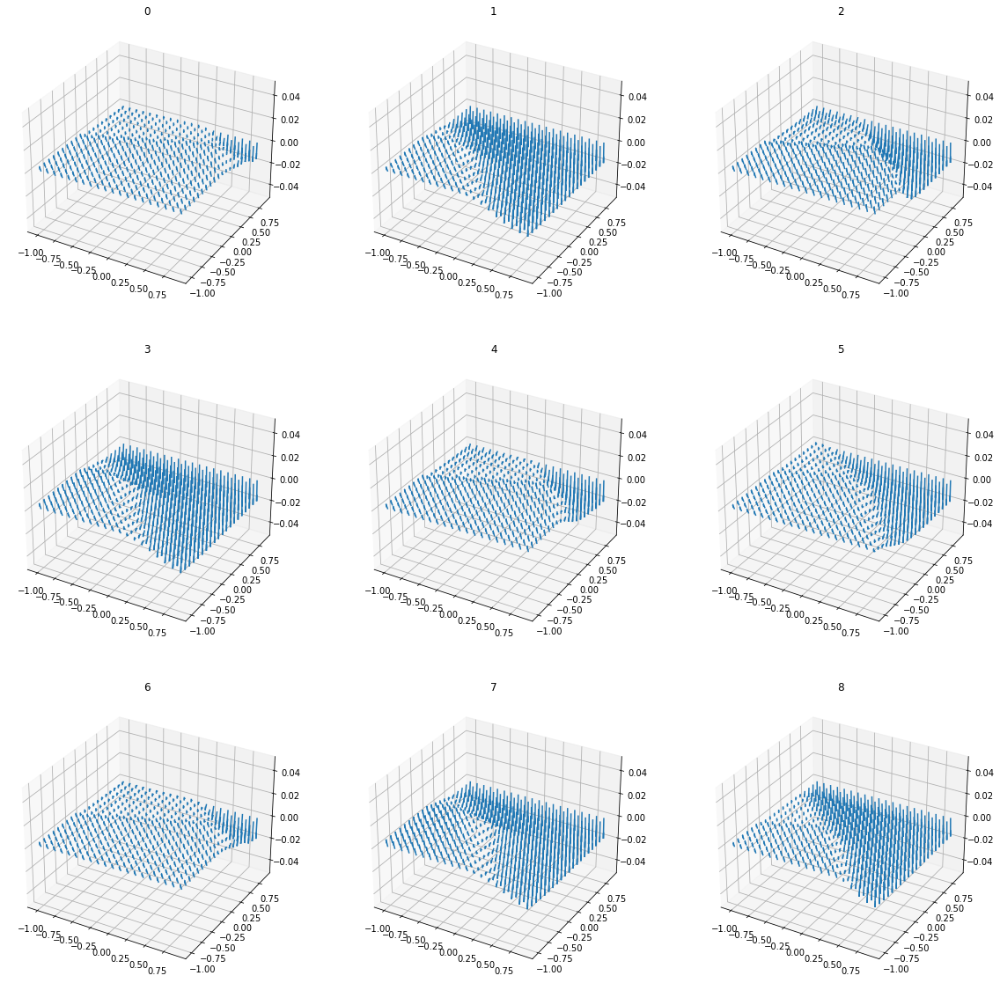

In [16]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## VAE(0.1)

In [17]:
decoder = cvae.ConditionalVAE.load_from_checkpoint('checkpoints/ee-vae-1e-1.ckpt')

In [18]:
decoder

ConditionalVAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (fc_mu): Linear(in_features=10, out_features=2, bias=True)
  (fc_var): Linear(in_features=10, out_features=2, bias=True)
  (dropout): Dropout(p=0, inplace=False)
)

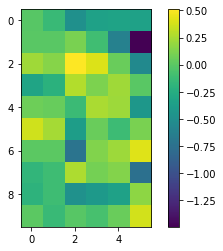

In [19]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

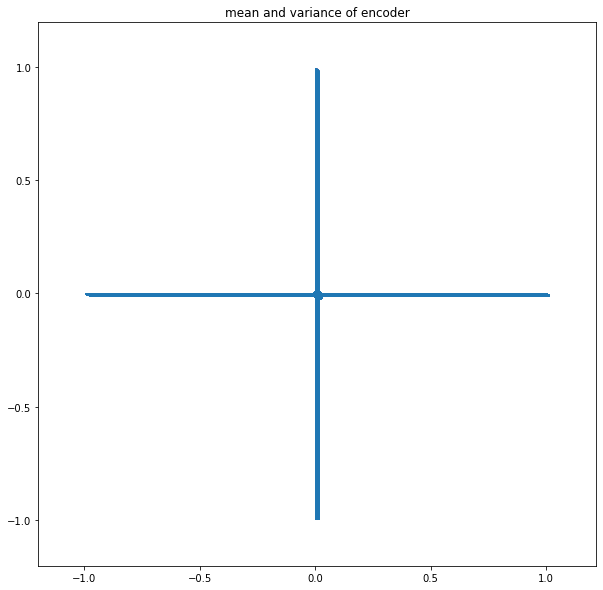

In [20]:
visualize_encoder(decoder)

{'x_min': -0.9969856, 'x_max': 1.0169852, 'y_min': -1.0020034, 'y_max': 0.99730545}


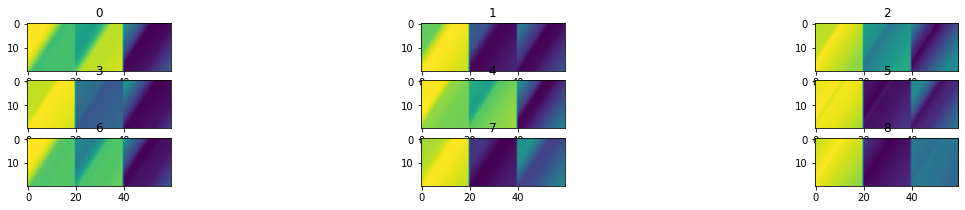

In [21]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


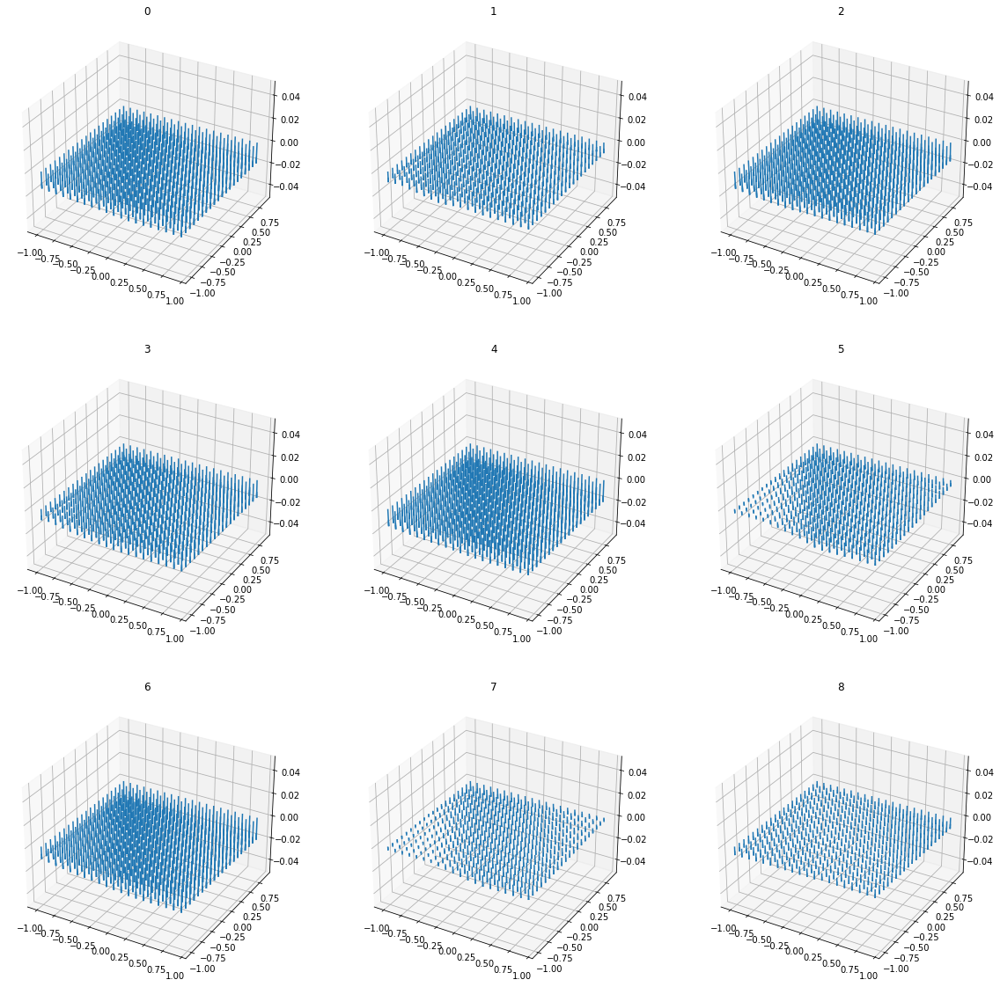

In [22]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## VAE(0.01)

In [23]:
decoder = cvae.ConditionalVAE.load_from_checkpoint('checkpoints/ee-vae-1e-2.ckpt')

In [24]:
decoder

ConditionalVAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (fc_mu): Linear(in_features=10, out_features=2, bias=True)
  (fc_var): Linear(in_features=10, out_features=2, bias=True)
  (dropout): Dropout(p=0, inplace=False)
)

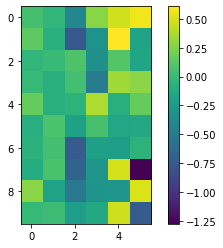

In [25]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

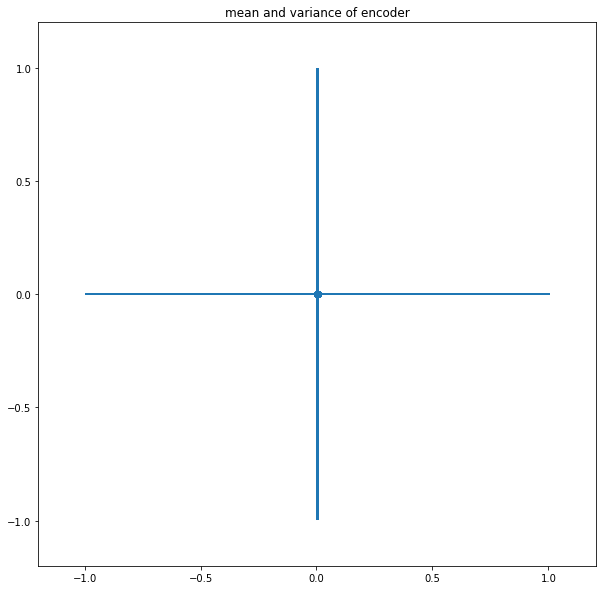

In [26]:
visualize_encoder(decoder)

{'x_min': -0.99829775, 'x_max': 1.0066743, 'y_min': -0.99916065, 'y_max': 1.00003}


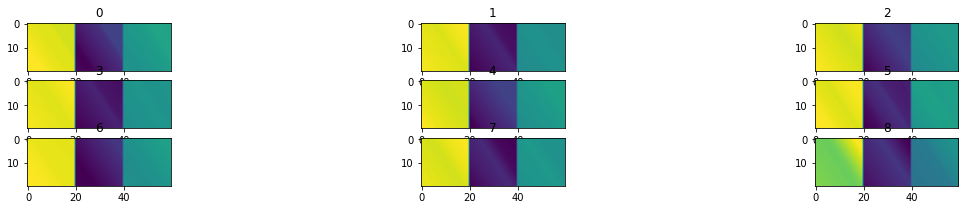

In [27]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


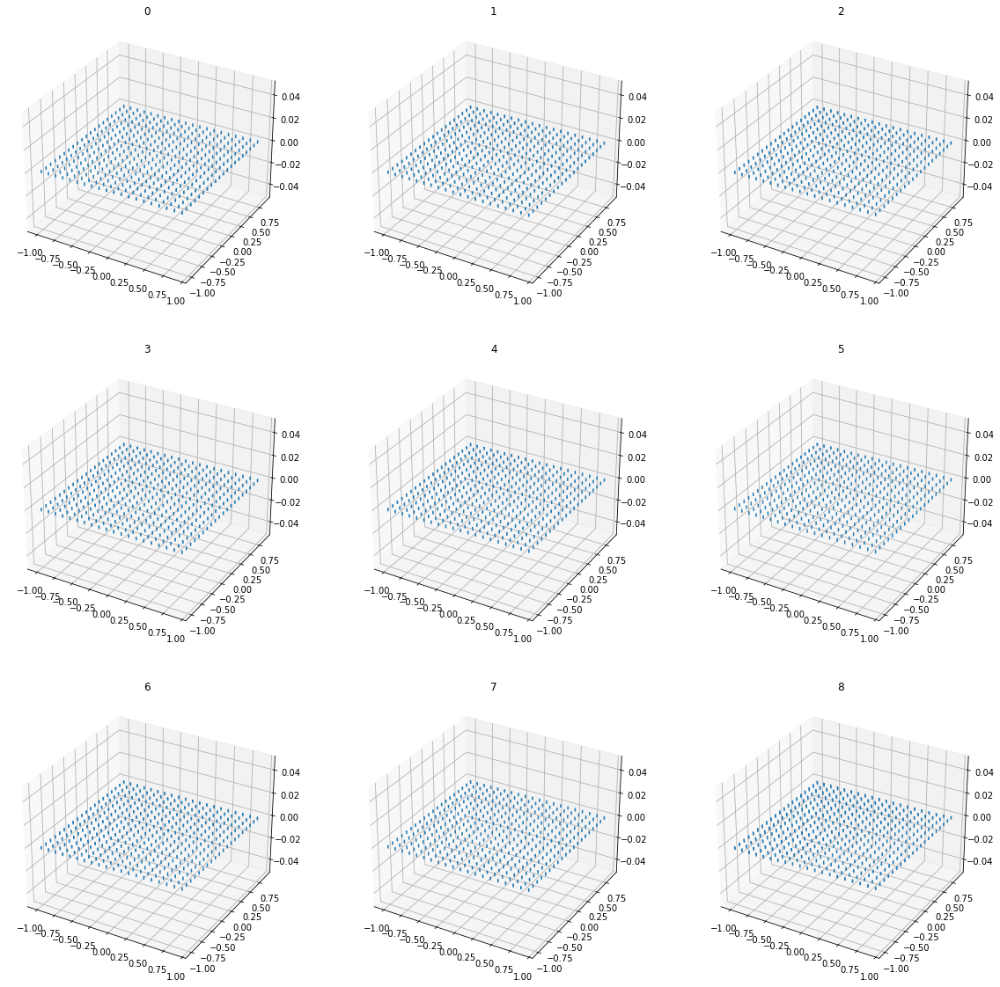

In [28]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## VAE(0.001)

In [29]:
decoder = cvae.ConditionalVAE.load_from_checkpoint('checkpoints/ee-vae-1e-3.ckpt')

In [30]:
decoder

ConditionalVAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (fc_mu): Linear(in_features=10, out_features=2, bias=True)
  (fc_var): Linear(in_features=10, out_features=2, bias=True)
  (dropout): Dropout(p=0, inplace=False)
)

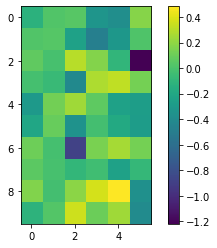

In [31]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

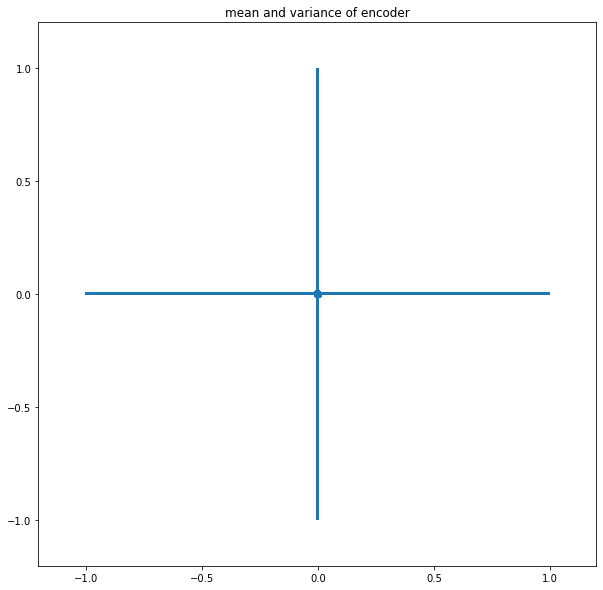

In [32]:
visualize_encoder(decoder)

{'x_min': -1.0029647, 'x_max': 1.0002532, 'y_min': -1.00018, 'y_max': 1.0039095}


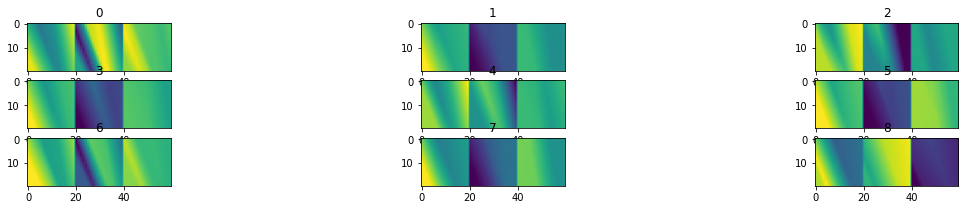

In [33]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


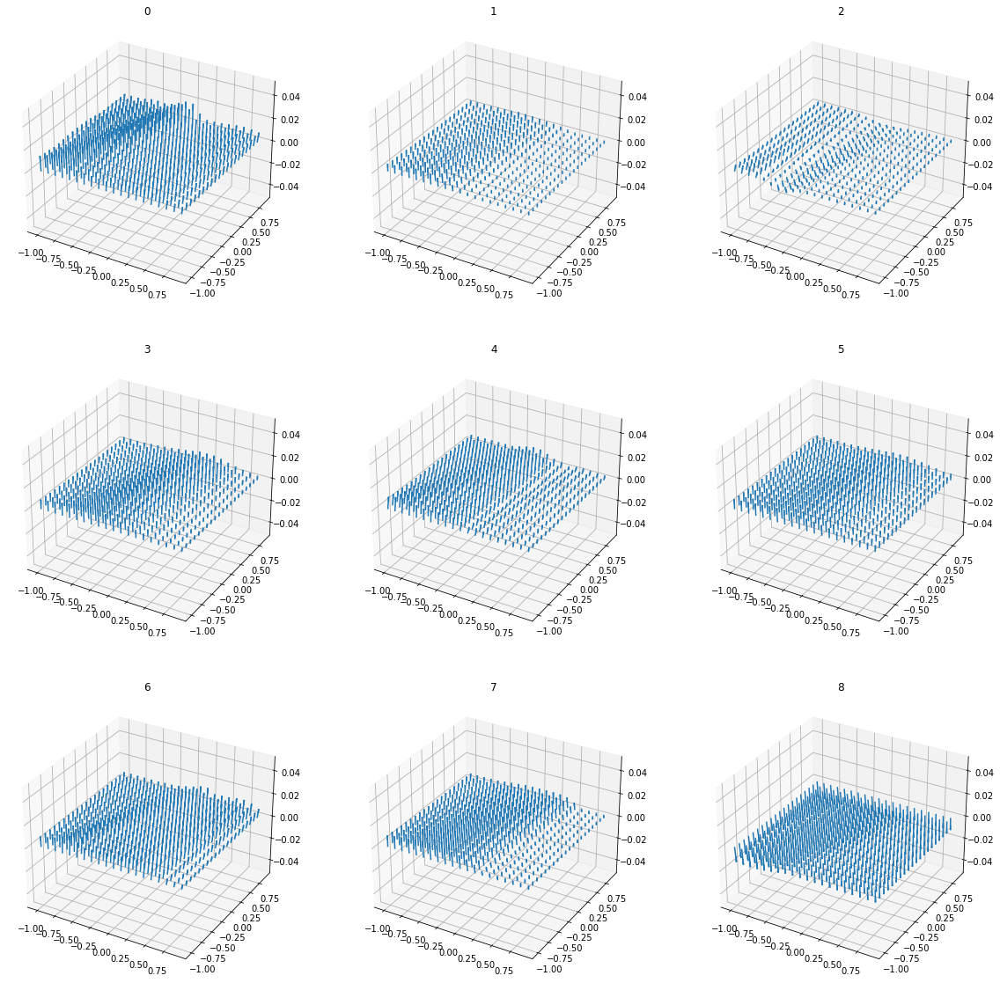

In [34]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## VAE(0.0001)

In [35]:
decoder = cvae.ConditionalVAE.load_from_checkpoint('checkpoints/ee-vae-1e-4.ckpt')

In [36]:
decoder

ConditionalVAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (fc_mu): Linear(in_features=10, out_features=2, bias=True)
  (fc_var): Linear(in_features=10, out_features=2, bias=True)
  (dropout): Dropout(p=0, inplace=False)
)

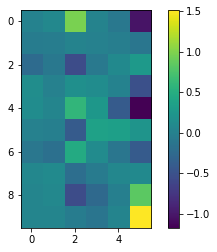

In [37]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

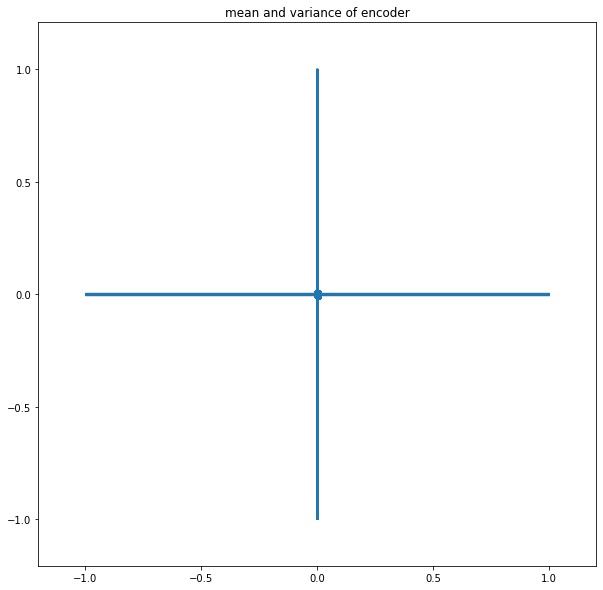

In [38]:
visualize_encoder(decoder)

{'x_min': -1.0012366, 'x_max': 1.0033764, 'y_min': -1.0052154, 'y_max': 1.0067341}


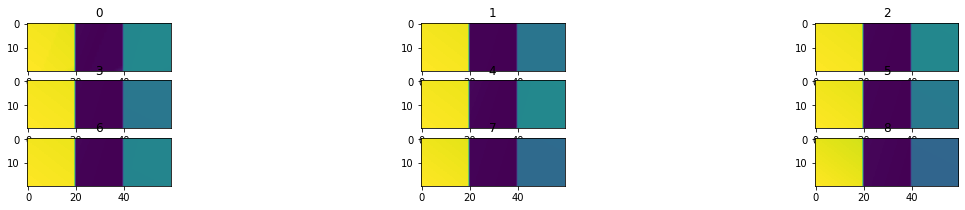

In [39]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


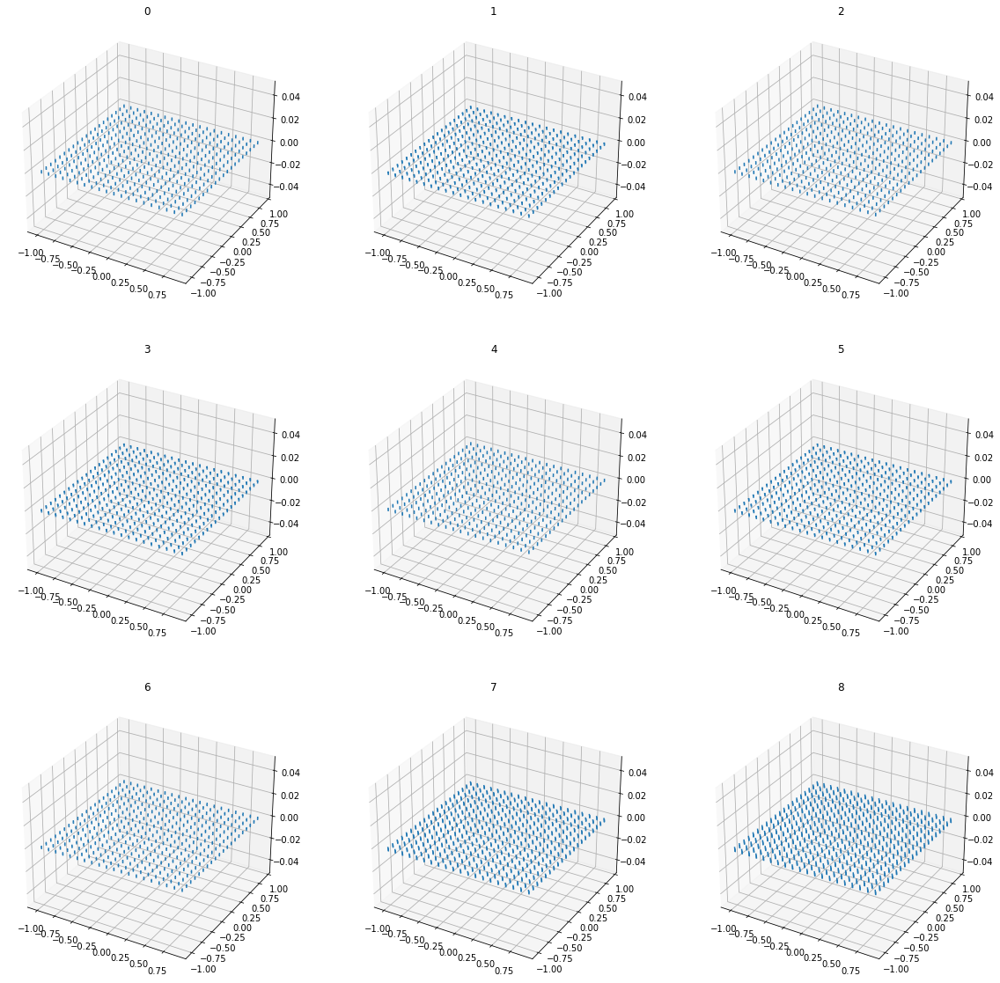

In [40]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## VAE(0.00001)

In [41]:
decoder = cvae.ConditionalVAE.load_from_checkpoint('checkpoints/ee-vae-1e-5.ckpt')

In [42]:
decoder

ConditionalVAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (fc_mu): Linear(in_features=10, out_features=2, bias=True)
  (fc_var): Linear(in_features=10, out_features=2, bias=True)
  (dropout): Dropout(p=0, inplace=False)
)

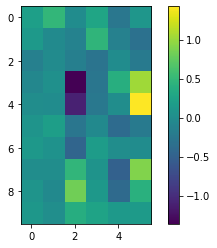

In [43]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

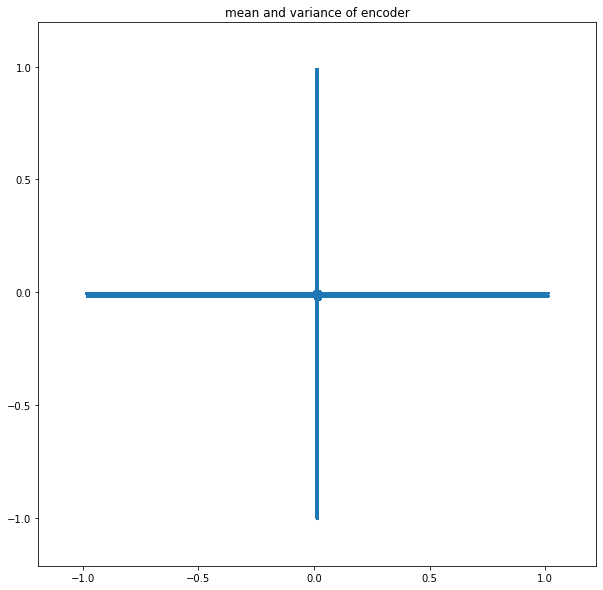

In [44]:
visualize_encoder(decoder)

{'x_min': -0.99056566, 'x_max': 1.0201322, 'y_min': -1.0120665, 'y_max': 0.9957688}


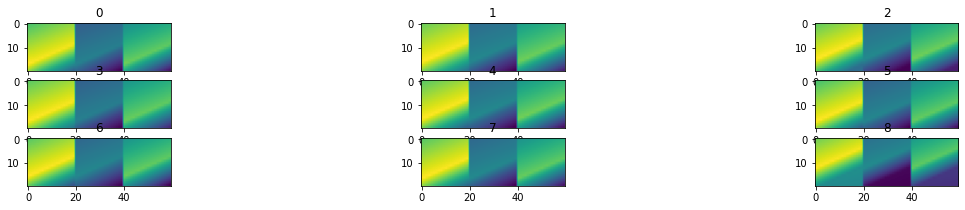

In [45]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


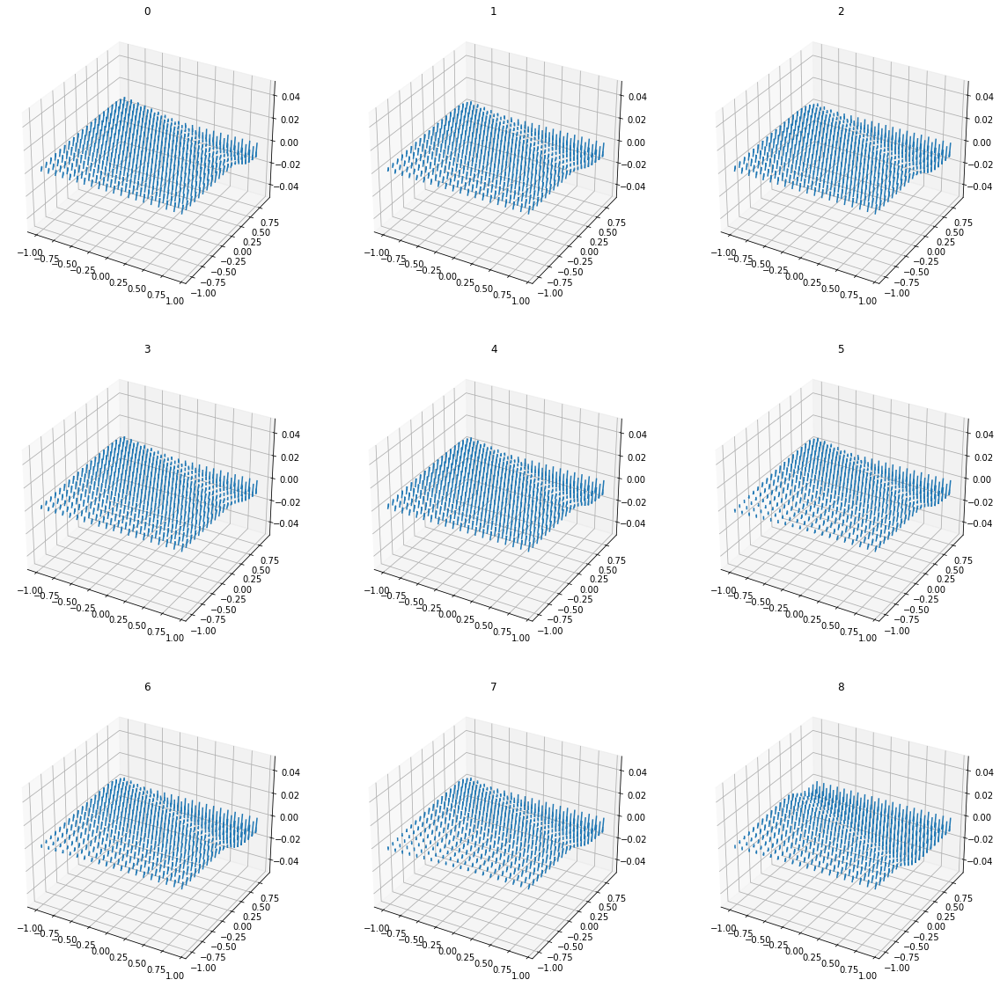

In [46]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## VAE(0.000001)

In [47]:
decoder = cvae.ConditionalVAE.load_from_checkpoint('checkpoints/ee-vae-1e-6.ckpt')

In [48]:
decoder

ConditionalVAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (fc_mu): Linear(in_features=10, out_features=2, bias=True)
  (fc_var): Linear(in_features=10, out_features=2, bias=True)
  (dropout): Dropout(p=0, inplace=False)
)

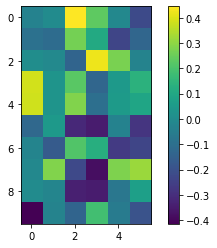

In [49]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

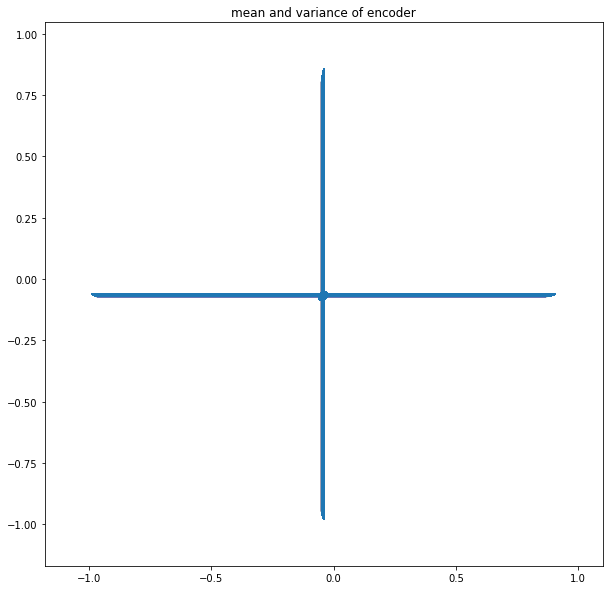

In [50]:
visualize_encoder(decoder)

{'x_min': -0.9915538, 'x_max': 0.91096795, 'y_min': -0.9849123, 'y_max': 0.8622564}


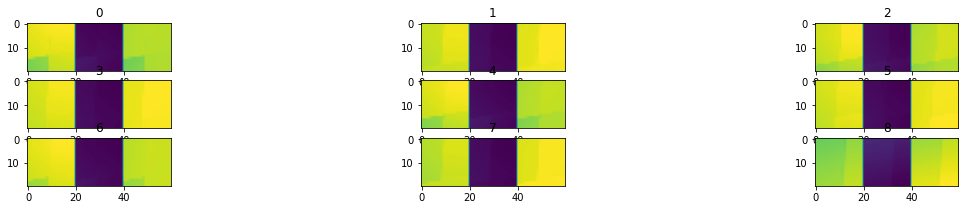

In [51]:
latent_bounds = get_latent_bounds(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


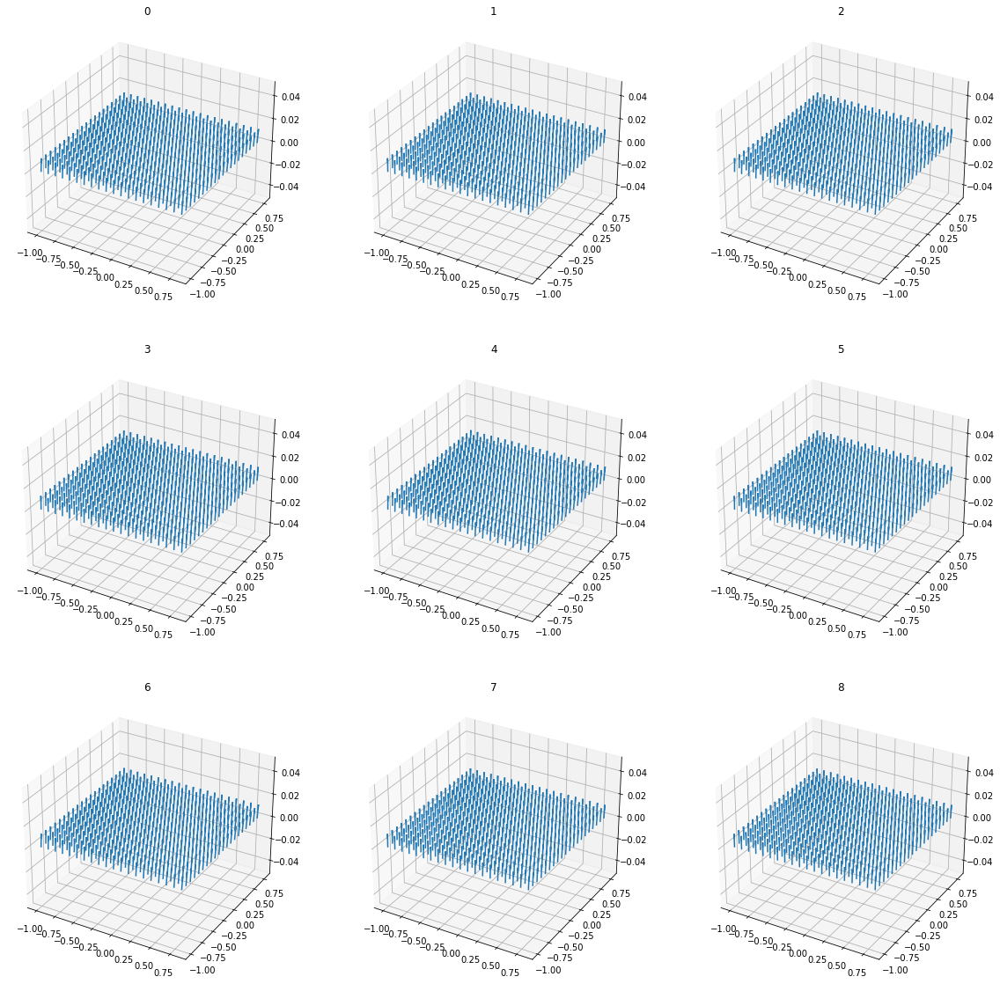

In [52]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## CAE

In [53]:
decoder = cvae.ConditionalAE.load_from_checkpoint('checkpoints/polished-deluge-535.ckpt')

In [54]:
decoder

ConditionalAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (dropout): Dropout(p=0, inplace=False)
)

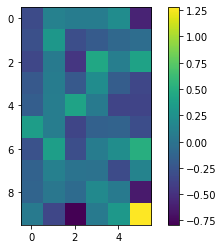

In [55]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

In [56]:
get_latent_bounds_ae(decoder)

{'x_min': -0.5445287227630615,
 'x_max': -0.11535501480102539,
 'y_min': -0.26677605509757996,
 'y_max': -0.030170470476150513}

{'x_min': -0.5445287227630615, 'x_max': -0.11535501480102539, 'y_min': -0.26677605509757996, 'y_max': -0.030170470476150513}


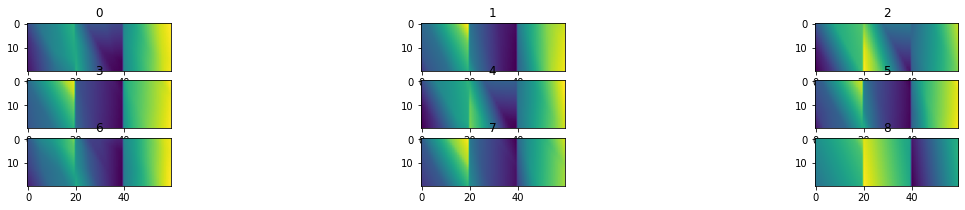

In [57]:
latent_bounds = get_latent_bounds_ae(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


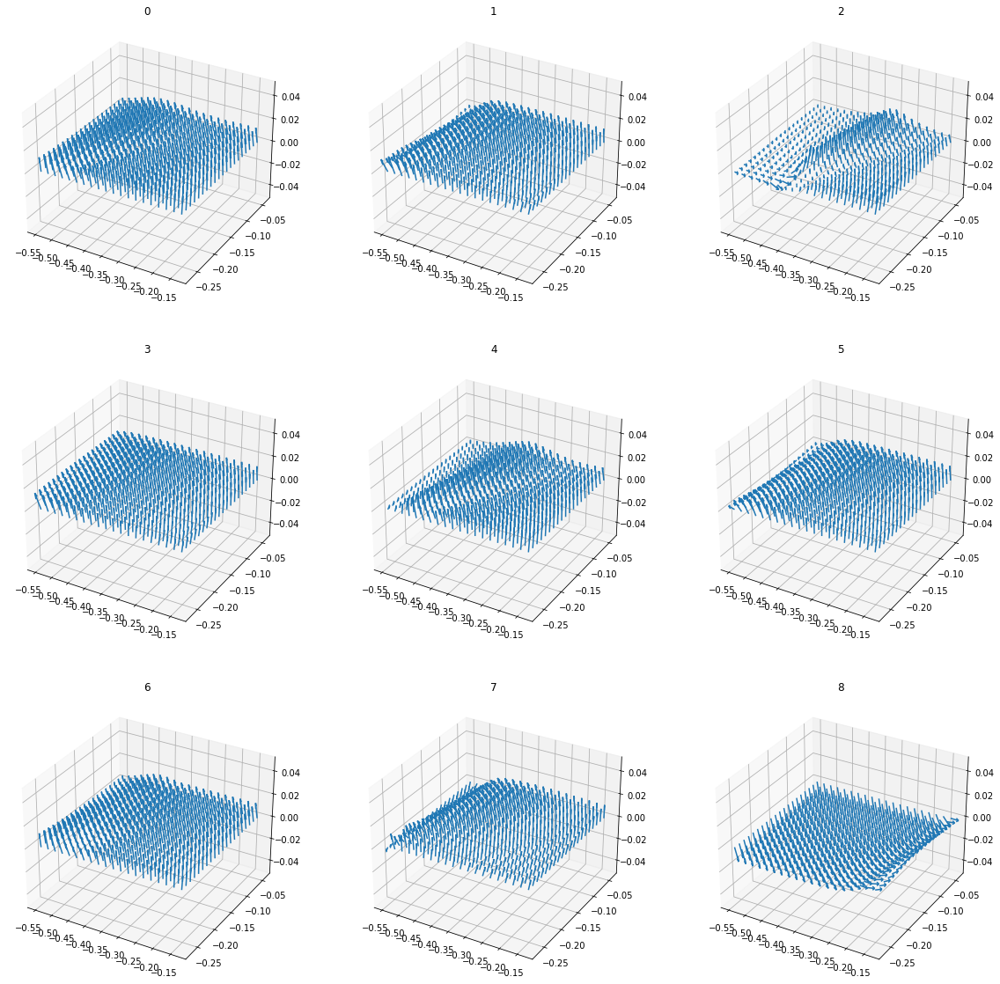

In [58]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## CAE (Dropout: 0.5)

In [59]:
decoder = cvae.ConditionalAE.load_from_checkpoint('checkpoints/wandering-mountain-537.ckpt')

In [60]:
decoder

ConditionalAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=4, bias=True)
  )
  (dropout): Dropout(p=0.5, inplace=False)
)

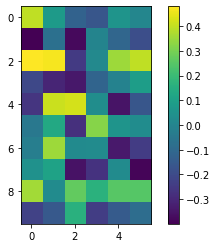

In [61]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

In [62]:
get_latent_bounds_ae(decoder)

{'x_min': 0.20187126100063324,
 'x_max': 0.4981074929237366,
 'y_min': 0.4817003607749939,
 'y_max': 0.911216139793396}

{'x_min': 0.20187126100063324, 'x_max': 0.4981074929237366, 'y_min': 0.4817003607749939, 'y_max': 0.911216139793396}


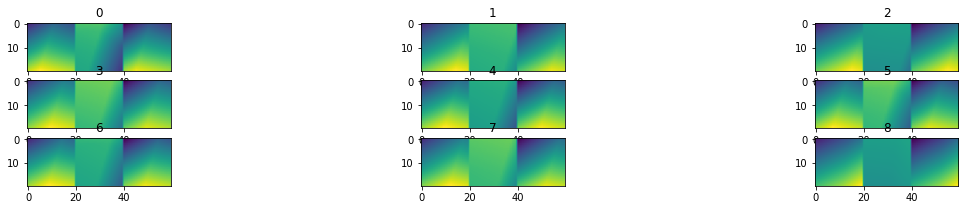

In [63]:
latent_bounds = get_latent_bounds_ae(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


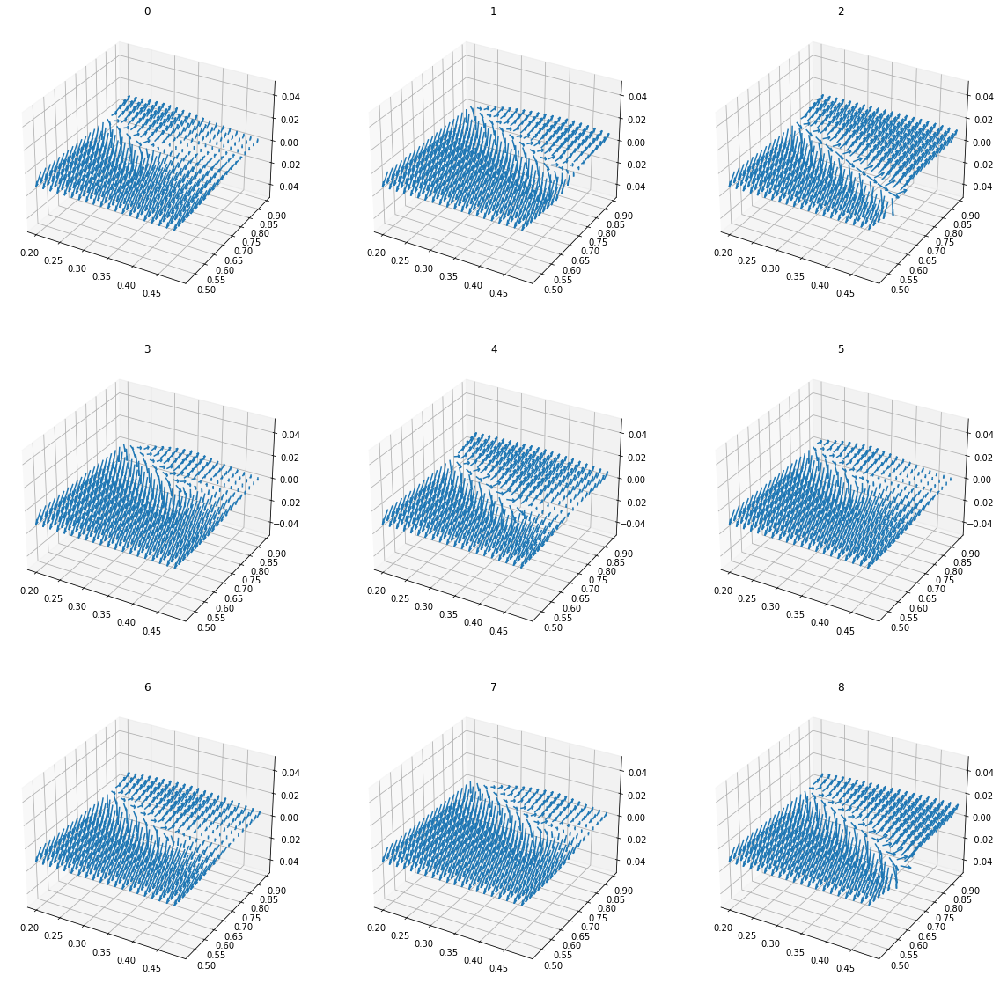

In [64]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## LinearCAE

In [65]:
decoder = cvae.ConditionalAE.load_from_checkpoint('checkpoints/autumn-sponge-538.ckpt')

In [66]:
decoder

ConditionalAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=4, bias=True)
  )
  (dropout): Dropout(p=0, inplace=False)
)

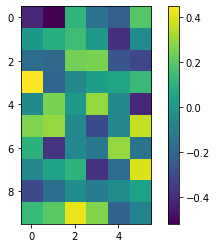

In [67]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

In [68]:
get_latent_bounds_ae(decoder)

{'x_min': -0.24979951977729797,
 'x_max': -0.06446155905723572,
 'y_min': -0.26623156666755676,
 'y_max': 0.022756081074476242}

{'x_min': -0.24979951977729797, 'x_max': -0.06446155905723572, 'y_min': -0.26623156666755676, 'y_max': 0.022756081074476242}


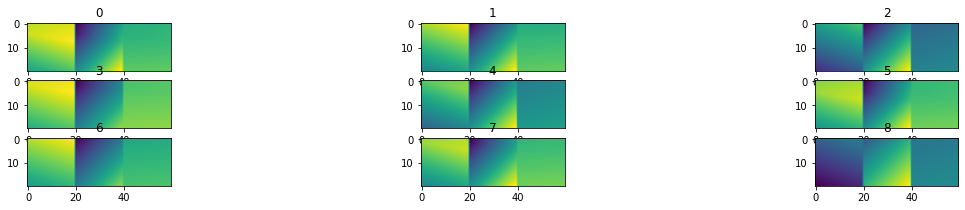

In [69]:
latent_bounds = get_latent_bounds_ae(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


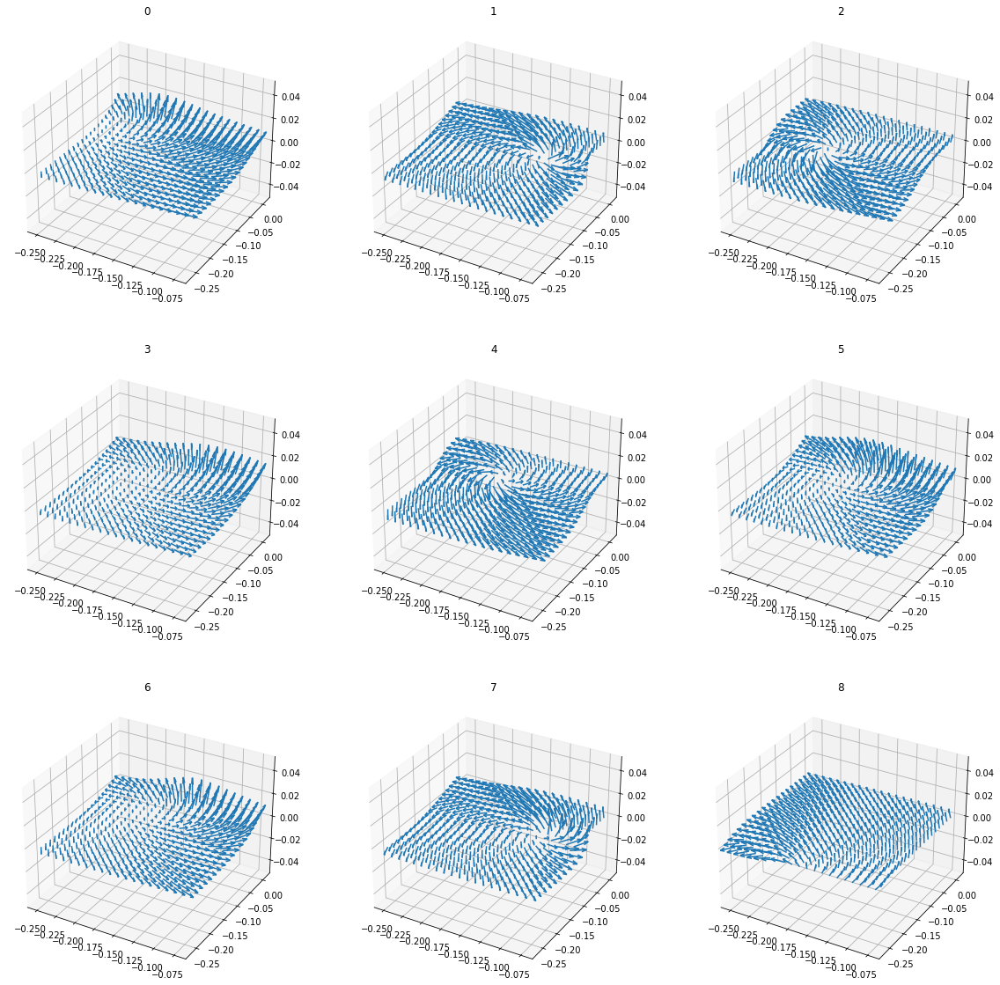

In [70]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## LinearCAE (Dropout: 0.5)

In [71]:
decoder = cvae.ConditionalAE.load_from_checkpoint('checkpoints/wandering-lake-539.ckpt')

In [72]:
decoder

ConditionalAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=4, bias=True)
  )
  (dropout): Dropout(p=0.5, inplace=False)
)

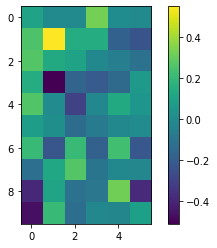

In [73]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

In [74]:
get_latent_bounds_ae(decoder)

{'x_min': -0.5121033191680908,
 'x_max': -0.01670759916305542,
 'y_min': 0.4420540928840637,
 'y_max': 0.7856012582778931}

{'x_min': -0.5121033191680908, 'x_max': -0.01670759916305542, 'y_min': 0.4420540928840637, 'y_max': 0.7856012582778931}


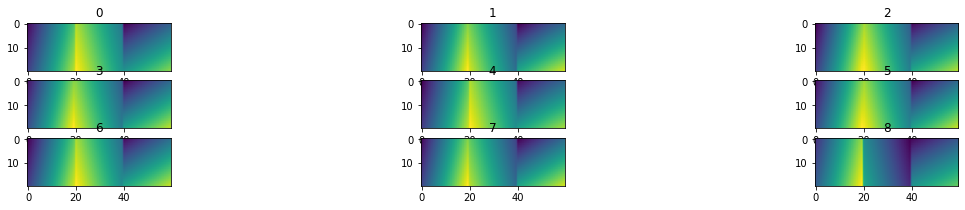

In [75]:
latent_bounds = get_latent_bounds_ae(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


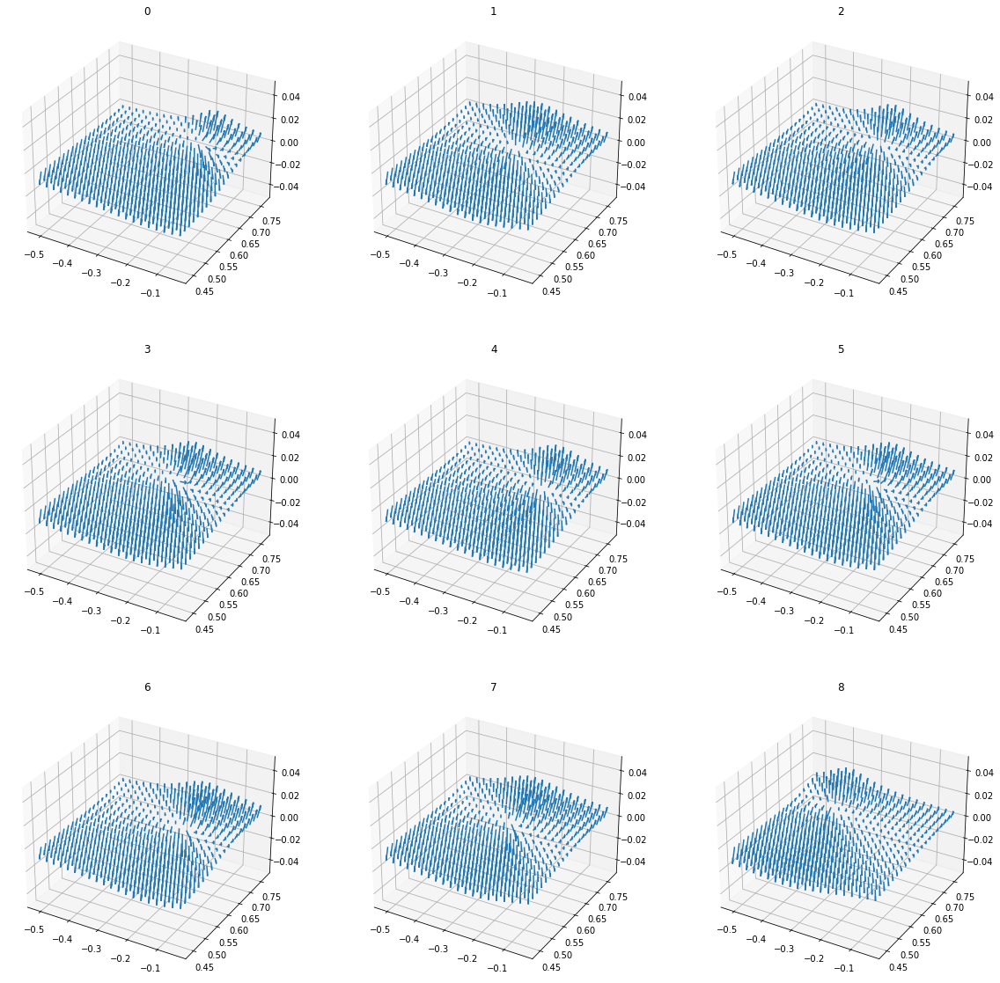

In [76]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)

## SmallCAE

In [77]:
decoder = cvae.ConditionalAE.load_from_checkpoint('checkpoints/drawn-resonance-540.ckpt')

In [78]:
decoder

ConditionalAE(
  (encoder): Sequential(
    (0): Linear(in_features=8, out_features=4, bias=True)
    (1): ReLU()
    (2): Linear(in_features=4, out_features=4, bias=True)
    (3): ReLU()
    (4): Linear(in_features=4, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=6, out_features=4, bias=True)
    (1): ReLU()
    (2): Linear(in_features=4, out_features=4, bias=True)
    (3): ReLU()
    (4): Linear(in_features=4, out_features=4, bias=True)
  )
  (dropout): Dropout(p=0.5, inplace=False)
)

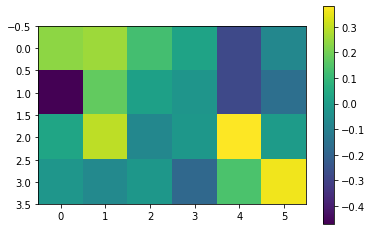

In [79]:
plt.imshow(next(decoder.decoder.parameters()).detach().numpy())
plt.colorbar()
plt.show()

In [80]:
get_latent_bounds_ae(decoder)

{'x_min': -1.3816227912902832,
 'x_max': -0.978294312953949,
 'y_min': 0.691677451133728,
 'y_max': 0.9864080548286438}

{'x_min': -1.3816227912902832, 'x_max': -0.978294312953949, 'y_min': 0.691677451133728, 'y_max': 0.9864080548286438}


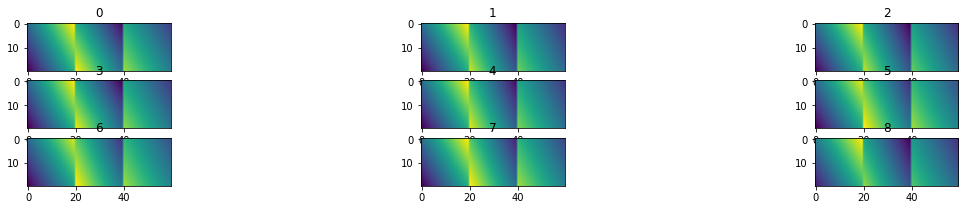

In [81]:
latent_bounds = get_latent_bounds_ae(decoder)
print(latent_bounds)
visualize_decoder(decoder, **latent_bounds)

(20, 20) (20, 20)


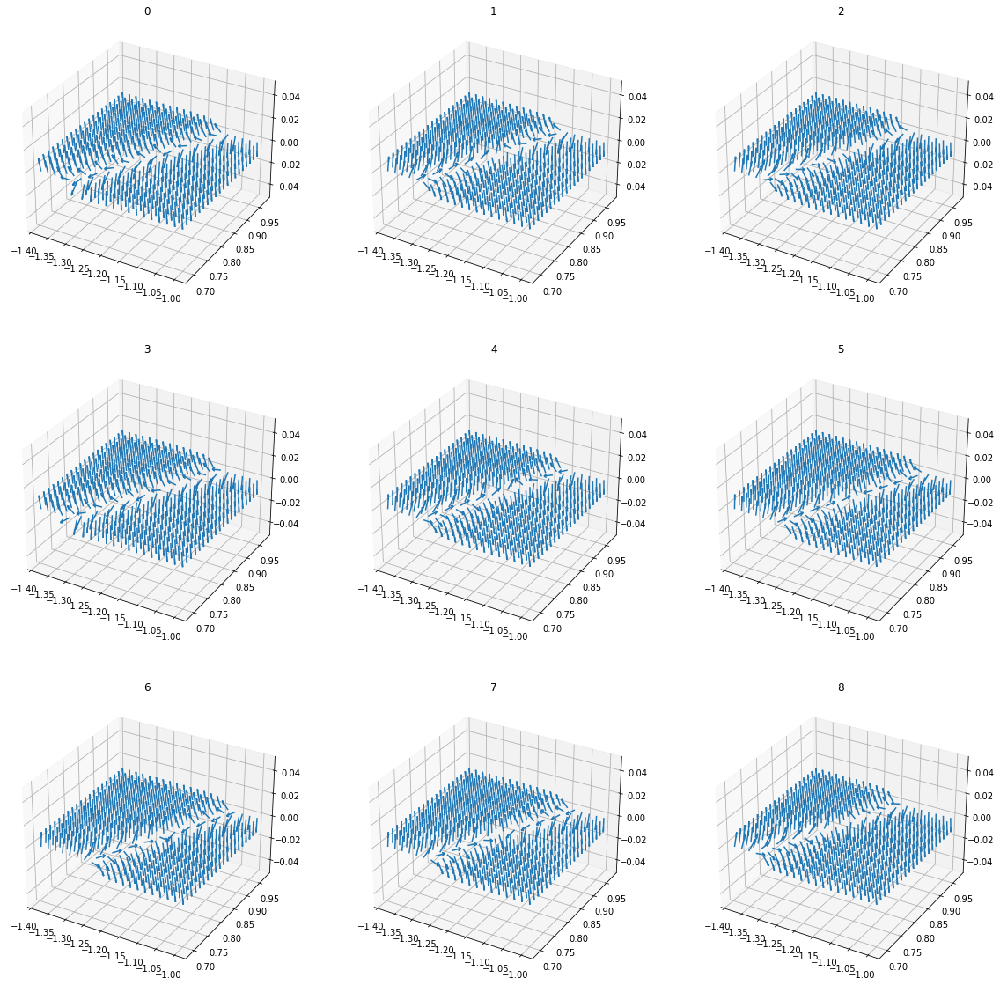

In [82]:
visualize_decoder_forward_kinematics(decoder, **latent_bounds)